**ESCUELA DE INGENIERÍA MECATRÓNICA**

## `PROCESAMIENTO DIGITAL DE SEÑALES E IMÁGENES`

### `Docente: Ms. Ing. Emerson Maximo Asto Rodriguez`

```
Práctica 7A: Filtrado en el espacio
```

### 1. Implemente un algoritmo que permita realizar la correlacion 2D de una imagen de MxN con una mascara de mxn
* El algoritmo debe retornar una imagen de las mismas dimensiones que la imagen de entrada, recuerde que el "padding" usualmente se hace con ceros, no obstante se puede duplicar filas o columnas del borde, o hacerlo mediante un espejo sobre el borde.*

* El algoritmo tambien puede obtener la solución sin necesidad del "padding", agregando varias condicionales que permitan solo ponderar con los datos coincidentes.*

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def filtro_espacial(imagen, filtro):
    M, N = imagen.shape #Obteniendo las dimensiones de la imagen
    m, n = filtro.shape #Obteniendo las dimensiones del filtro

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * filtro
            resultado[i-filas_add, j-columnas_add] = np.sum(multiplicacion)

    return resultado

1. ¿Por qué es importante el uso de técnicas de padding en la aplicación de filtros espaciales? 
  
    El añadir los bordes a la imagen con padding es importante para evitar que se reduzca el tamaño de la imagen al momento de la convolución.  
  
2. Explica qué es un kernel (o máscara) en un filtro espacial y cómo influye su tamaño en el procesamiento de imágenes.
  
    Es una matriz que cuyos coeficientes definen la naturaleza del filtro que aplica al ser aplicada a la imagen en cuestión.

In [3]:
img = np.arange(100).reshape(10,10)
filtro = np.ones((5,7))

print(img)
print(filtro)

img_filtrada = filtro_espacial(img, filtro)

[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]
 [30 31 32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47 48 49]
 [50 51 52 53 54 55 56 57 58 59]
 [60 61 62 63 64 65 66 67 68 69]
 [70 71 72 73 74 75 76 77 78 79]
 [80 81 82 83 84 85 86 87 88 89]
 [90 91 92 93 94 95 96 97 98 99]]
[[1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]]


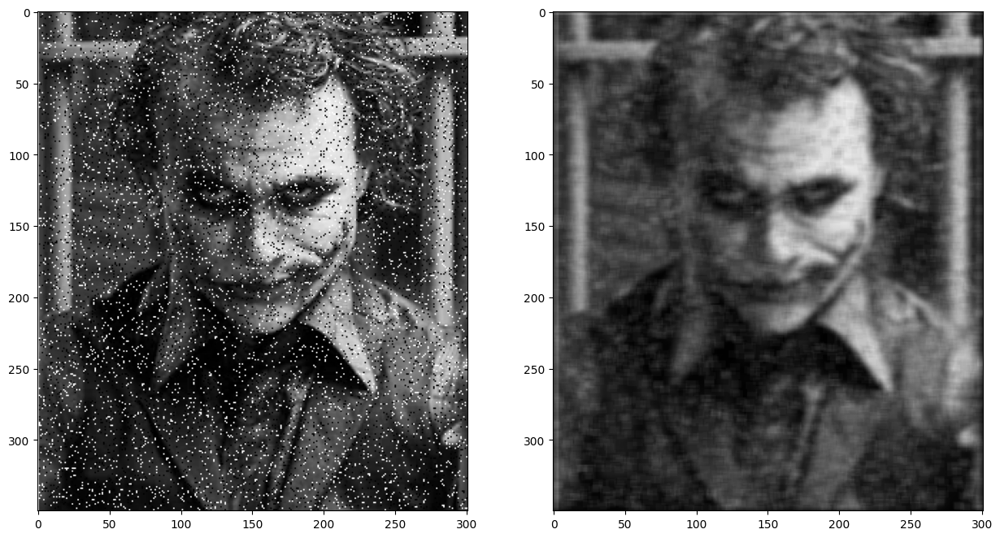

In [4]:
img_ruido = cv2.imread('../../Imagenes/ruido.png', 0)/255   

filtro = np.ones((5,7))
filtro = filtro/np.sum(filtro)

img_ruido_filtrada = filtro_espacial(img_ruido, filtro)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_ruido, cmap='gray')
plt.subplot(122)
plt.imshow(img_ruido_filtrada, cmap='gray', vmin=0, vmax=1)
plt.show()

### 2.- Implemente un algoritmo que permita mejorar solo los pixeles oscuros y de bajo contraste
*Puede modificar levemente el algoritmo realizado en el enunciado **1** para lograr el objetivo*

In [5]:
def filtro_espacial_estadistico(imagen, selem = np.ones((3,3))):
    media_global = np.mean(imagen)
    desv_global = np.std(imagen)

    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            media_loc = np.mean(multiplicacion)
            desv_loc = np.std(multiplicacion)

            if (media_loc<media_global) and (desv_loc<0.8*desv_global) and (desv_loc>0.2*desv_global):
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]*1.5
            else:
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]

    return resultado

1. ¿Cuál es el objetivo de este algoritmo y qué tipo de imágenes se benefician más de su aplicación?
   
   Mejora imágenes oscuras y de poco contraste, las imágenes que mejor se benefician son aquellas imágenes en las que hay pobre visualización y distinción de las figuras por el bajo contraste y brillo.
  
2. Vecindad y Kernel: ¿Cómo se define la vecindad de un píxel en este código y cuál es la importancia de la variable selem en este contexto?
   
   La vecindad se define por un pixel y los pixeles de su alrededor, el tamaño de esta ventana de pixeles determinado por la matriz selem, que en este caso se trata de una matriz de 3x3, por lo tanto la ventana de pixeles serían el pixel elegido, más los 8 pixeles adyacentes.
   
3. ¿Qué efecto tiene el factor de escala de 1.5 en los píxeles mejorados y cómo podría ajustarse para obtener diferentes resultados?
   
   Incrementa el brillo un 50% en los cada pixeles seleccionados, para mayor brillo solo se necesitaría aumentar el valor de 1.5, y para disminuir el brillo de la imagen original se necesitaría dar valores menores a 1.

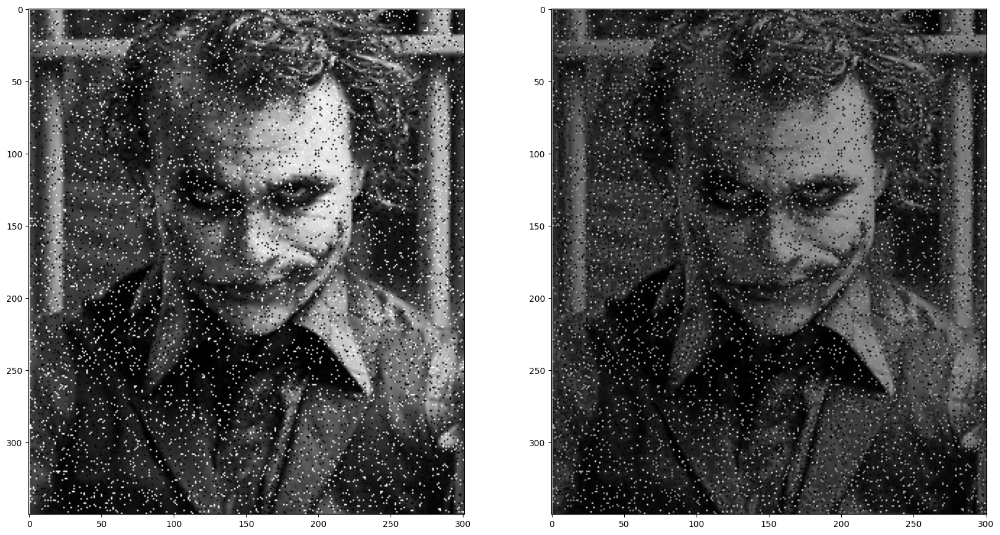

In [6]:
img_delfin = np.uint16(cv2.imread('../../Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, np.ones((5,5)))
plt.subplots(1,2, figsize=(20,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

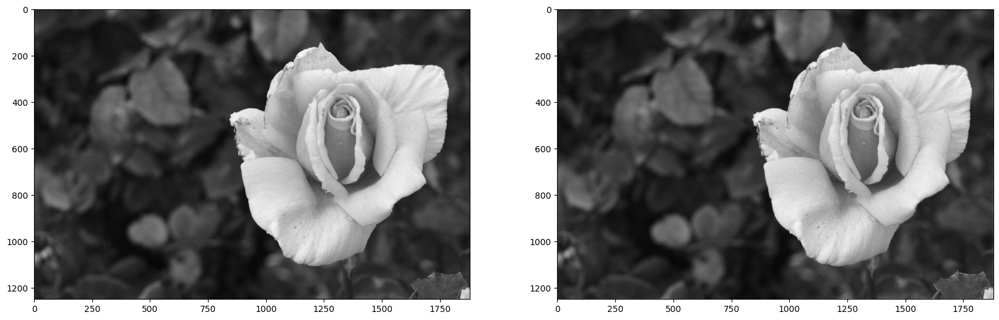

In [7]:
img_delfin = np.uint16(cv2.imread('../../Imagenes/delfin.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, np.ones((5,7)))
plt.subplots(1,2, figsize=(20,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 3.- Implemente los filtros estadisticos min, max, moda y mediana


In [8]:
from scipy.stats import mode

def filtro_espacial_estadistico(imagen, selem = np.ones((3,3)), filter_type='min'):
    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

#     img_pad = np.zeros((M+ filas_adicionales*2, N + columnas_adicionales*2))
    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            if filter_type =='min':
                resultado[i-filas_add, j-columnas_add] = np.min(multiplicacion)
            elif filter_type == 'max':
                resultado[i-filas_add, j-columnas_add] = np.max(multiplicacion)
            elif filter_type == 'median':
                resultado[i-filas_add, j-columnas_add] = np.median(multiplicacion)
            elif filter_type == 'mode':
                resultado[i-filas_add, j-columnas_add] = mode(multiplicacion, axis=None)[0]

    return resultado

1. ¿Qué es un filtro estadístico en el procesamiento de imágenes y cómo se aplica en el código mostrado?
   
   El filtro estadistico procesa la imagen original reemplazando los valores de los pixeles, por el resultado de aplicar a la vecindad de estos pixeles, una función específica, como en el código usando las funciones de mínimo, máximo, mediana o moda.

2. ¿Qué diferencias existen entre los filtros de tipo min, max, median y mode? Explica en qué situaciones sería adecuado usar cada tipo.
   
   min: El fitrlo mínimo reduce el tamaño de características con más brillo de una imagen, encargandose de eliminar el ruido de gran brillo de ciertas imágenes. También ayuda a cunado se quiere identificar las areas más oscuras de una imagen.
    max: El filtro máximo dilata los detalles con más brillo de una imágen, se encarga de eliminar el ruido oscuro, por lo mismo ayuda a encontrar las partes con más brillo de una imgaen.
    median: Este filtro reemplaza los pixeles en la vecindad por el promedio de brillo de los pixeles en dicha vecindad, por lo que reduce el ruido en general, preservando los límites de brillo, sirve para suavizar imágenes, y reduce ambos tipos de ruido, de poco y mucho brillo.
    mode: reemplaza los pixeles por el valor más común de una vecindad, ayuda a eliminar ruido de cuantificación, preservando los detalles.


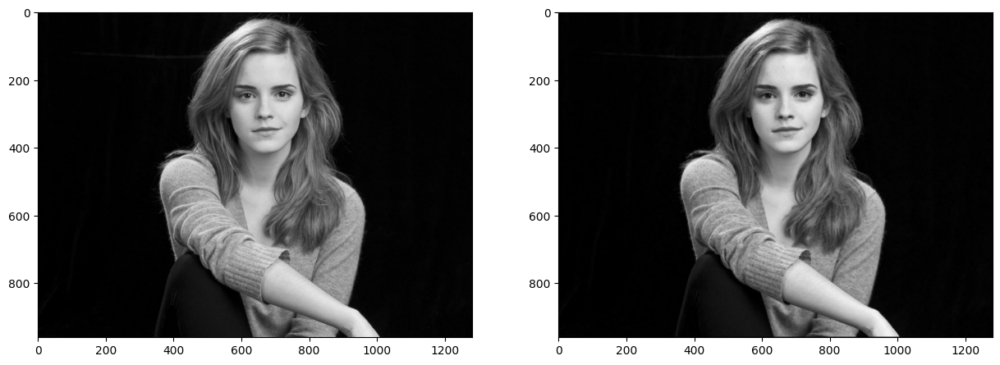

In [9]:
#MINIMO
img_delfin = np.uint16(cv2.imread('../../Imagenes/emma.jpeg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, filter_type= "min")
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

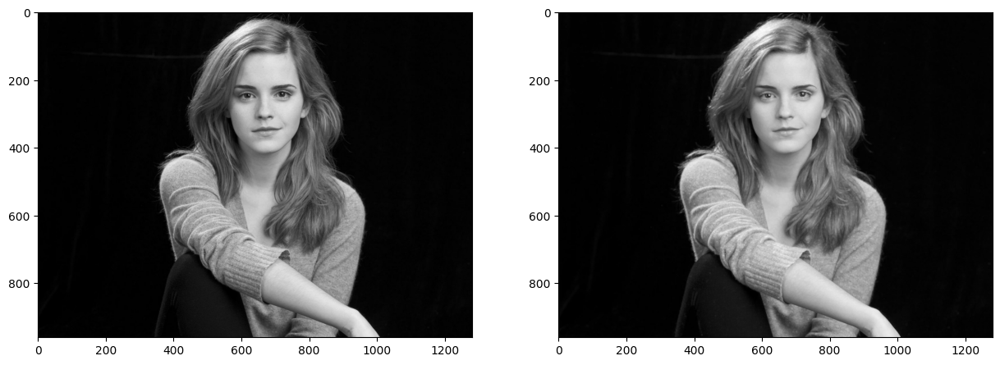

In [10]:
#MAX
img_delfin = np.uint16(cv2.imread('../../Imagenes/emma.jpeg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, filter_type="max")
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

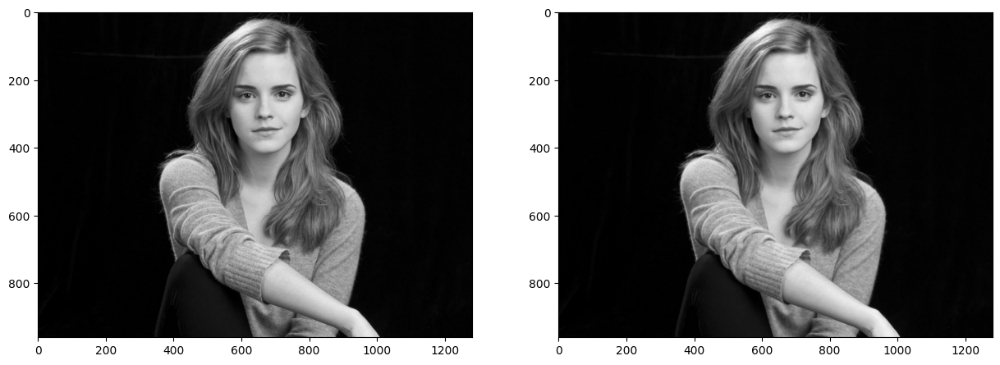

In [11]:
#MEDIANA
img_delfin = np.uint16(cv2.imread('../../Imagenes/emma.jpeg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, filter_type="median")
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

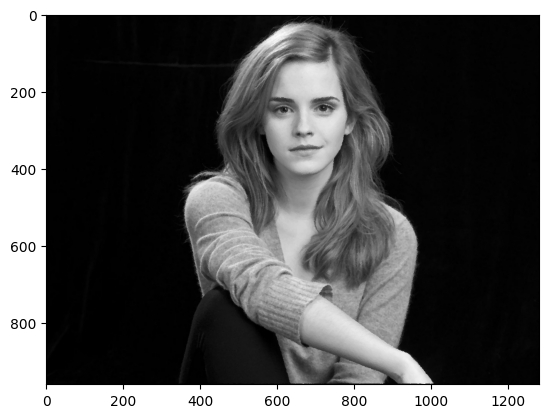

In [12]:
img_median_mode = filtro_espacial_estadistico(img_delfin_filtrada, filter_type='mode')
plt.imshow(img_median_mode, cmap='gray')
plt.show()

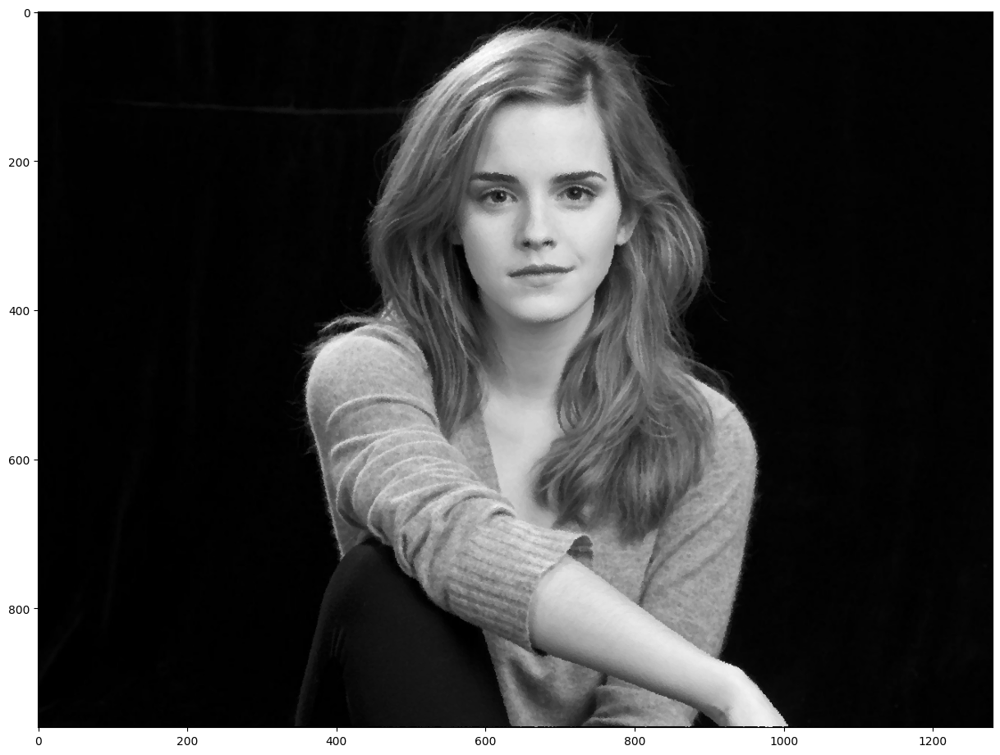

In [13]:
plt.figure(figsize=(15,15))
plt.imshow(img_median_mode, cmap='gray')
plt.show()

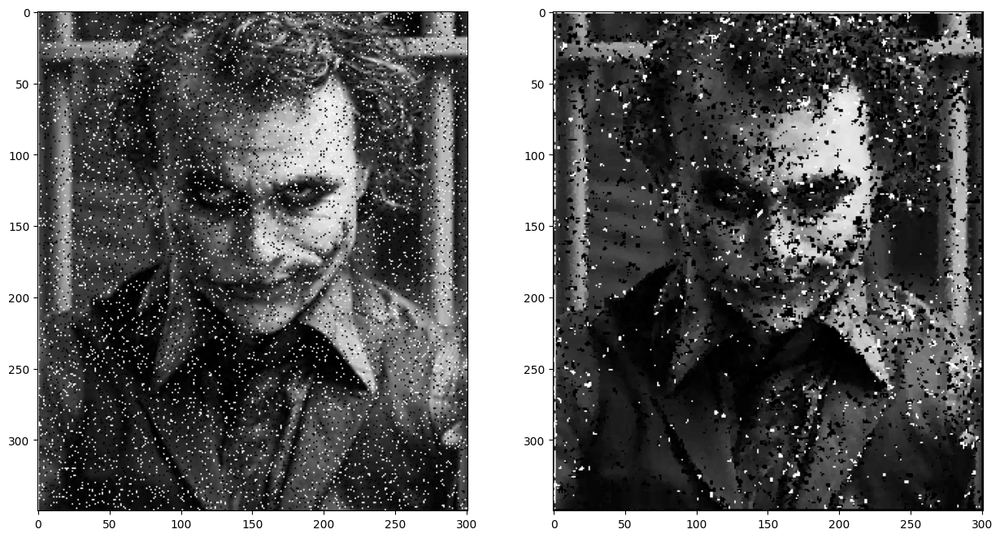

In [14]:
#MODA
img_delfin = np.uint16(cv2.imread('../../Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, filter_type="mode")
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 4.- Implemente los filtros espaciales de suavizado y nitidez explicados en clase

Utilizando la funcion **convolve2d(img, kernel, mode= "same")** de **scipy.signal** y los kernels: 
(tambien se puede usar **correlate2d**)
* Promedio
* Gaussiano
* Laplaciano


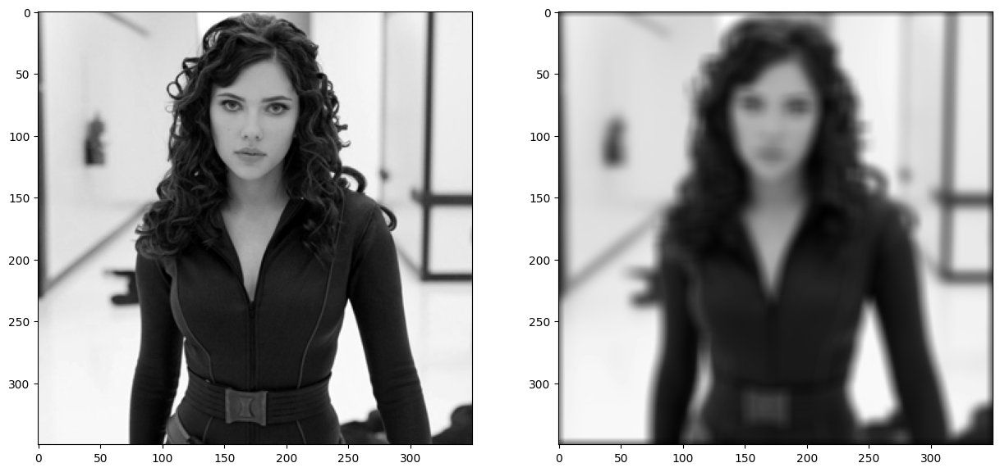

In [15]:
#PROMEDIO
from scipy import signal

img = cv2.imread("../../Imagenes/scarlett_oc.png", 0)/255
kernel = np.ones((11,11))/121

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

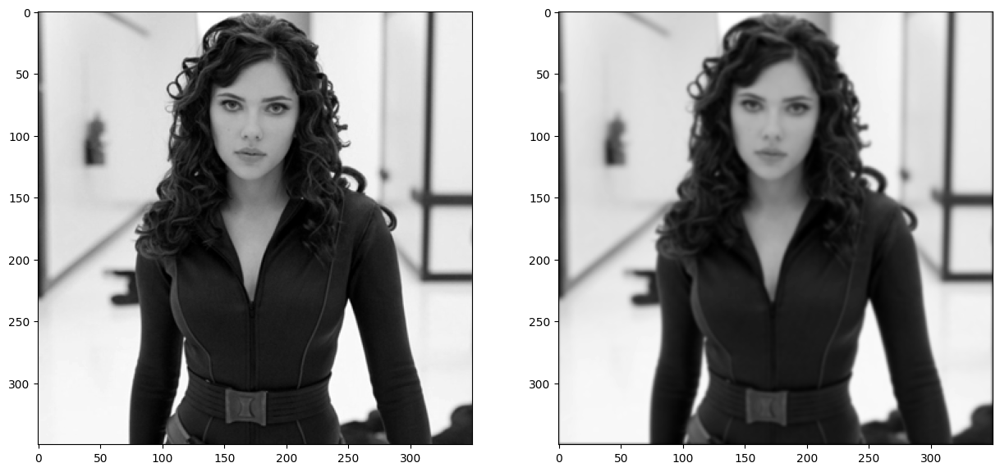

In [16]:
#PROMEDIO
from scipy import signal

# kernel = np.array([[1,2,1], [2,4,2], [1,2,1]])/16
kernel = np.array([1,4,7,4,1])*np.array([[1],[4],[7],[4],[1]])
kernel = kernel/np.sum(kernel)

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

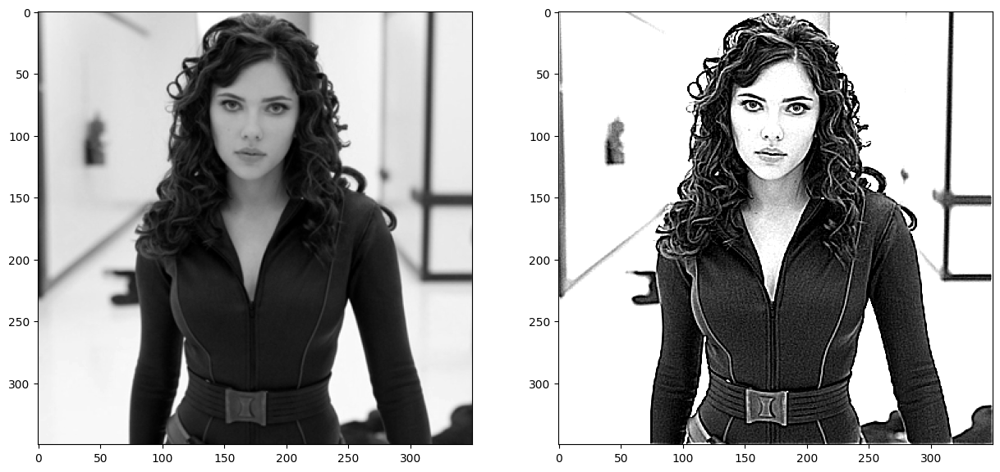

In [17]:
#LAPLACIANO
from scipy import signal
A = 1.5

kernel = np.array([[-1,-1,-1], [-1,A+8,-1], [-1,-1,-1]])

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

**Utilizando OpenCV:**
* cv2.blur(img, (Tamaño_kernel))
* cv2.GaussianBlur(img,(Tamaño_kernel),desviacion_estandar)
* cv2.medianBlur(img,Tamaño_kernel)
* cv2.bilateralFilter(img,tamaño_kernel,sigmacolor,sigmaspace)  [Mas info](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html)

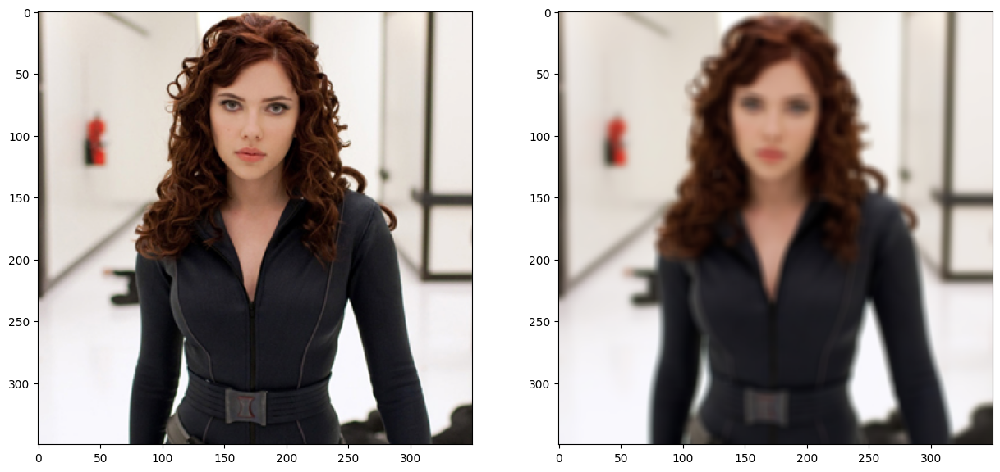

In [18]:
img = cv2.imread("../../Imagenes/scarlett_oc.png")[..., ::-1]

out = cv2.blur(img, (7,7))

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

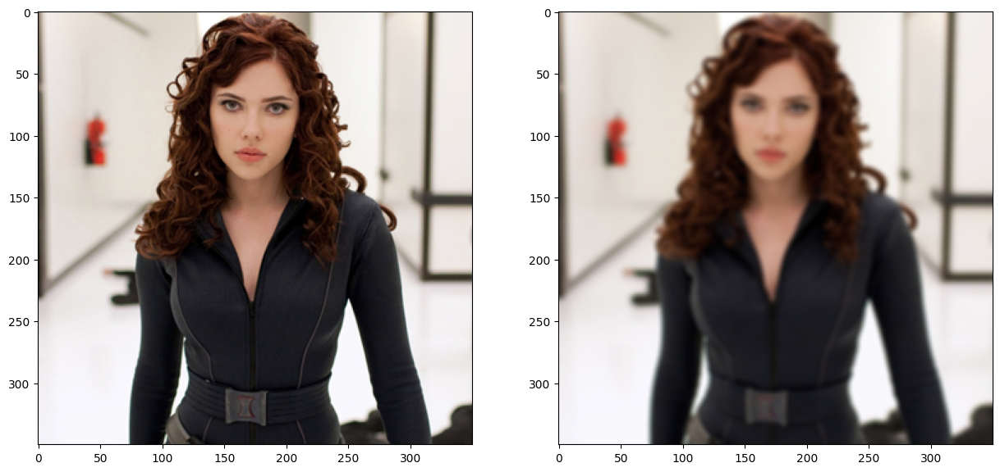

In [19]:
out = cv2.GaussianBlur(img,(7,7), 2)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

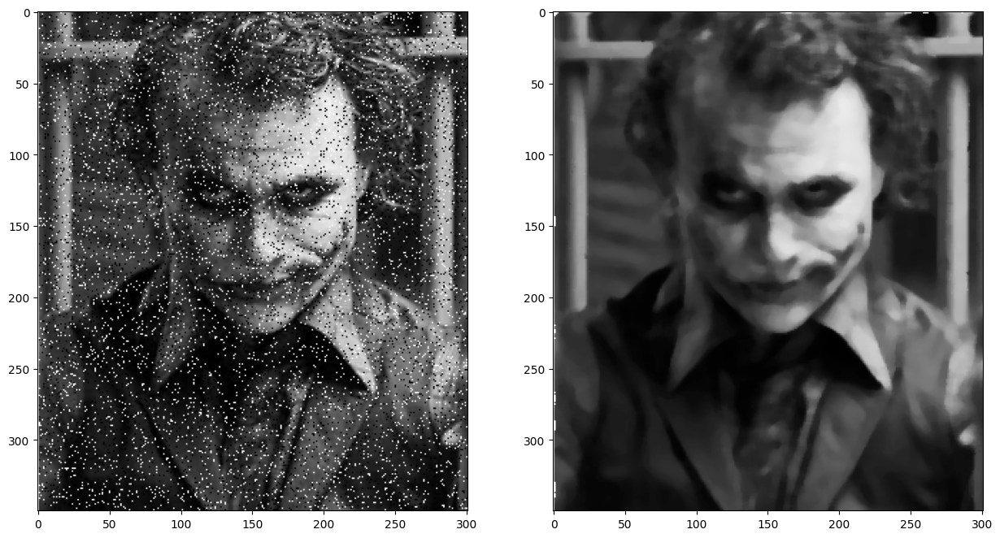

In [20]:
img_joker = cv2.imread('../../Imagenes/ruido.png')[..., ::-1]

img_joker_filtrada = cv2.medianBlur(img_joker, 7)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_joker, cmap='gray')
plt.subplot(122)
plt.imshow(img_joker_filtrada, cmap='gray')
plt.show()

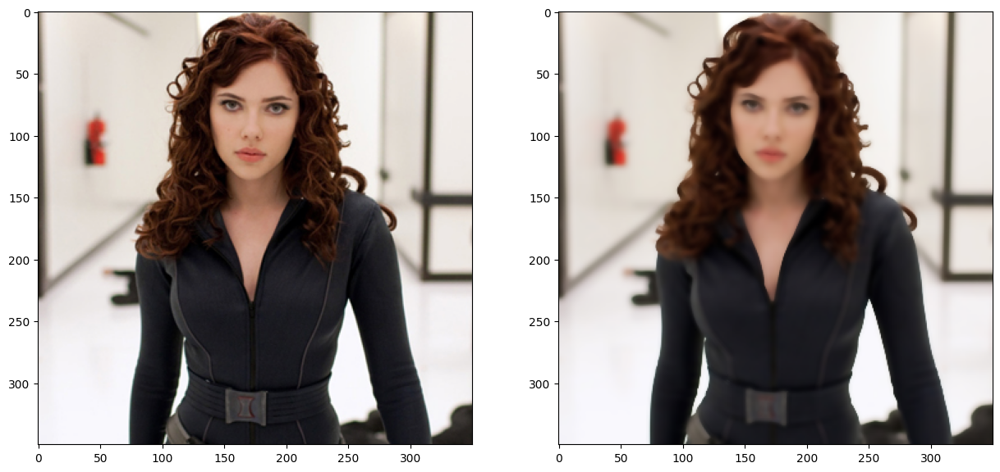

In [21]:
out = cv2.bilateralFilter(img,7, 160, 160)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la diferencia fundamental entre los filtros de suavizado (como el de promedio y el Gaussiano) y los filtros de nitidez (como el Laplaciano)?
   
   El filtro de suavizado se encarga particularmente de eliminar el ruido por ejemplo reemplazando los valores de los pixeles por el promedio de la vecindad, reduciendo los detalles. Mientras que los efectos de nitidez mejorean la vizualización de biordes y detalles en la imagen calculando las differencias entre los detalles de las imágenes, incrementando el contraste. Con el caviat de poder también resaltar más el ruido.

2. ¿Cuáles son las principales diferencias en los resultados obtenidos al aplicar un filtro de promedio versus un filtro Gaussiano?
   
   Un filtro promedio, como ya se dijo, reemplaza el valor de un pixel por el promedio de su vecindad, dando un suavizado a la imagen volviendola un poco más borrosa, mientras que el filtro gaussiano reemplaza cada pixel dterminando el peso por un la distribución gaussiana de los pixeles alrededor, donde los pixeles cercanos al centro del kernel tienen un mayor valor, dando a la imagen una difmunación más natural.

3. ¿Qué propiedades tiene el kernel Laplaciano y cómo contribuye a la nitidez de la imagen? ¿Qué efectos visuales produce al aplicarse a una imagen?
   
   Las regiones uniformes de las imágenes no se ven afectadas, se resaltan areas los bordes y esquinas gracias a la doble derivada presente y por el centro de peso del Kernel Laplacioano. Esta definición de los bordes y esquinas es lo que ayuda a la mejora de la nitidez.
Los efectos visuales que se pueden producir, a parte de la mejora de los bordes y los detalles, son el efecto halo, donde se puede notar una especie de anillo alrededor de los bordes de las imágenes por el enfasis en la segunda derivada, además de que se puede amplificar el ruido.

4. ¿Qué significa el argumento mode="same" en la función convolve2d y cómo afecta el tamaño de la imagen resultante después de aplicar el filtro?
   
   Significa que el tamaño de la imagen de salida del filtro será igual al tamñao de entrada, debido al padding de la imagen que puede aumentar el tamaño de la imagen.

### 5.- Implemente un algoritmo para muestre el uso de la mascara de desenfoque (unsharp mask) y el filtro de altoaumento (Highboost)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


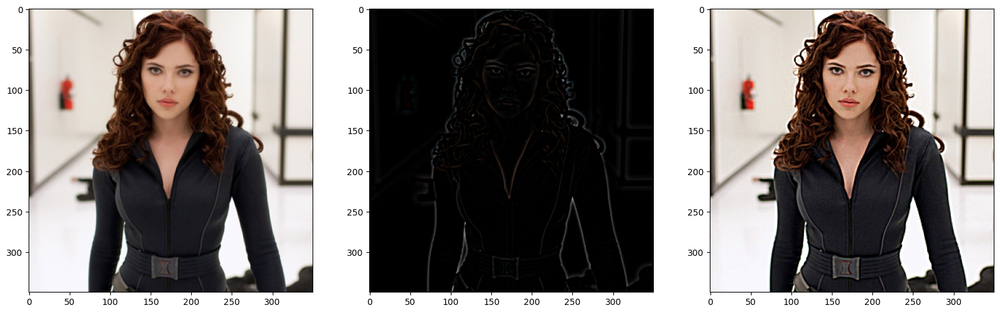

In [22]:
img = cv2.imread("../../Imagenes/scarlett_oc.png")[..., ::-1]/255

blur = cv2.blur(img, (7,7))

mask = img - blur

unsharp_image = mask + img

plt.figure(figsize=(20,15))
plt.subplot(131)
plt.imshow(img, cmap="gray")
plt.subplot(132)
plt.imshow(mask, cmap="gray")
plt.subplot(133)
plt.imshow(unsharp_image, cmap='gray', vmin=0, vmax=1)
plt.show()

1. ¿Cómo funciona la máscara de desenfoque (unsharp mask) para realzar los detalles de una imagen, y cuál es el papel del filtro de suavizado en este proceso?
   
   El filtro pasa primero por un proceso de sharpening, esta imagen se resta con una imagen que pasa por el filtro de suavizado, creando una "unsharp mask" (vista como la imagen en medio) y se vuelve a sumar a la imagen original para ver el resultado.

2.  ¿En qué se diferencia el filtro de alto aumento (Highboost) de la máscara de desenfoque estándar, y cómo se puede ajustar el factor de amplificación (boosting factor) para controlar el nivel de realce en la imagen?
   
    El Highboost tiene casi el mismo procedimiento que un Unsharp Mask, con el añadido que se amplifica a la máscara (la resta de la imagen enfocada y desenfocada) para realzar los detalles de una imágen. Esta amplificación está determinada por el valor del boosting factor.

### 6.- Implemente un algoritmo para mostrar la gradiente de una imagen
**Use las mascaras:**
* Roberts
* Prewit
* Sobel
* Scharr

In [23]:

# Roberts
roberts_x = np.array([[1, 0], [0, -1]])
roberts_y = np.array([[0, 1], [-1, 0]])

# Prewitt
prewitt_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

# Sobel
sobel_x = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

# Scharr
scharr_x = np.array([[3, 0, -3], [10, 0, -10], [3, 0, -3]])
scharr_y = np.array([[3, 10, 3], [0, 0, 0], [-3, -10, -3]])

In [24]:
# Función para calcular el gradiente
def calcular_gradiente(imagen, filtro_x, filtro_y):
    grad_x = signal.convolve2d(imagen, filtro_x, mode="same")
    grad_y = signal.convolve2d(imagen, filtro_y, mode="same")
    gradiente = np.sqrt(grad_x**2 + grad_y**2)
    return gradiente, grad_x, grad_y

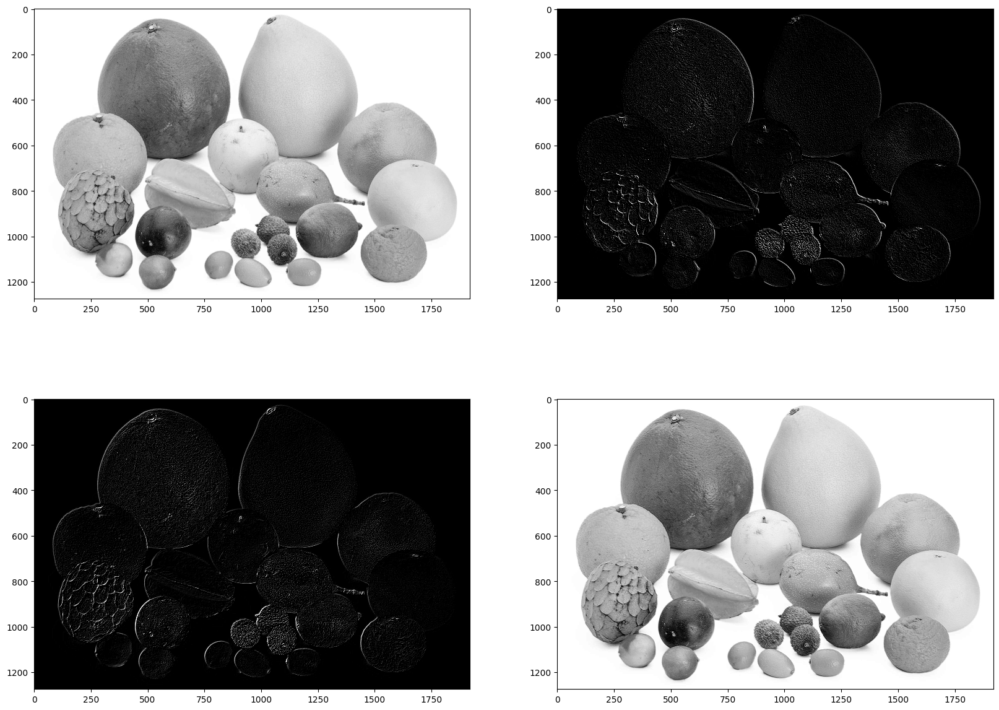

In [25]:
#ROBERTS
img = cv2.imread("../../Imagenes/frutas.jpeg", 0)/255

kernelh = np.array([[0,-1],[1,0]])
kernelv = np.array([[-1,0],[0,1]])

outh = signal.convolve2d(img, kernelh, mode= "same")
outv = signal.convolve2d(img, kernelv, mode= "same")

outf = outh + outv

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(img, cmap="gray")
plt.subplot(222)
plt.imshow(outh * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(223)
plt.imshow(outv * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(224)
plt.imshow(outf + img, cmap="gray", vmin=0, vmax=1)
plt.show()

Text(0.5, 1.0, 'Gradiente - Roberts')

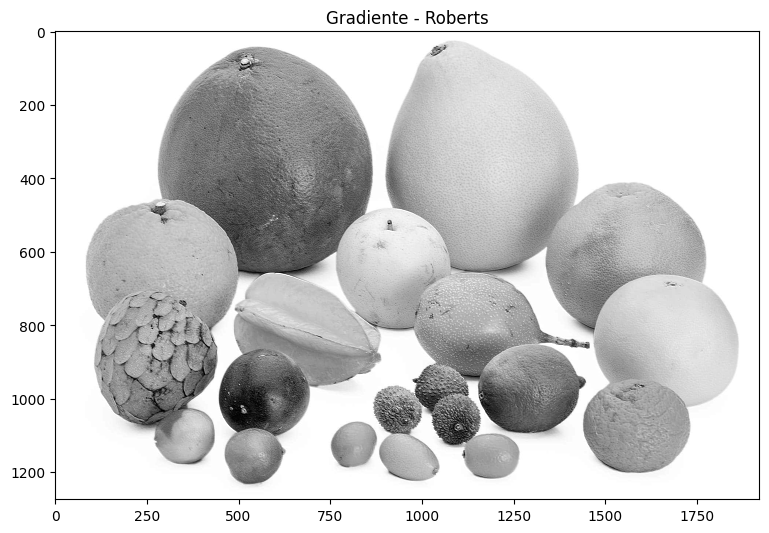

In [26]:
gradiente_roberts = calcular_gradiente(img, roberts_x, roberts_y)
# Mostrar resultados
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(gradiente_roberts[2]+img, cmap='gray', vmin=0, vmax=1)
plt.title('Gradiente - Roberts')


1. ¿Cuál es la característica distintiva de la máscara de Roberts al calcular el gradiente de una imagen, y por qué podría ser menos precisa que otras máscaras?
   
   La máscara de Roberts utiliza dos matrices kernels de 2x2 para aproximar el gradiente en direcciones diagonal y antidiagonal, debido a esta aproximacion se producen resultados menos precisos en comparación a Sobel y Schar. Presicamente estos errores son resaltados en imágenes con bordes complejos y mucho ruido.

2. ¿Cómo afectan las máscaras de Sobel y Scharr a la precisión y sensibilidad en la detección de bordes en una imagen? ¿En qué casos se prefiere una sobre la otra?
   
   Sobel usa matrices Kernel de 3x3 para calcular el gradiente, para calcular el gradiente en vertical y horizontal, dando una mayor presición que Roberts y con menor sensibilidad al ruido. Scharr tiene Kernels de 3x3 de coeficientes ponderados que dan maor importancia a los pixeles centrales, dando mayor prescición en los bordes diagonales. Ambos son buenos en la detección de bordes, pero para una detección de detalles finos con bordes diagonales, Scharr es el mejor. Mientras que para la mayoría de casos es preferible usar Sobel.